# Capstone Step 3 Exploratory Data Analysis

<font color = 'teal'>Importing nessacary packages</font>

 **Exploratory Data Analysis involves** 
 * Build data profile tables and plots
 * Explore data relationships
 * Feature Selection


![](https://assets.weforum.org/editor/UZi1yKmS3bNepn2NneR2li_tXMitu9EFIRBY4LyTldE.gif)

<font color = 'teal'>Import libraries<font/>

In [1]:
import pandas as pd 
import numpy as np
import sklearn
import matplotlib.pyplot as plt
import os
import seaborn as sns 
from scipy import stats
import cufflinks as cf
import plotly
import plotly.offline as py
import plotly.graph_objs as go
from IPython.core.display import Image
import plotly.express as px 
import pandas_profiling

<font color='cyan'>Loading the csv file which is created in the end of step 2 from the data  folder.</font>


In [2]:
#Loading the csv file and storing it in a variable df 
df = pd.read_csv('covid_updated_file.csv')

In [3]:
#Printing the current working directory
os.getcwd()

'C:\\Users\\user\\Springboard\\Course\\CapStone - 1\\Exploratory Data Analysis'

In [4]:
#printing the first five rows of the dataframe df
df.head()

,Unnamed: 0,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
0,0,Asia,Afghanistan,2019-12-31,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,0.000000,597.029,9.59,0.0,0.0,37.746,0.5,64.83
1,1,Asia,Afghanistan,2020-01-01,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.650195,597.029,9.59,0.0,0.0,37.746,0.5,64.83
2,2,Asia,Afghanistan,2020-01-02,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.650195,597.029,9.59,0.0,0.0,37.746,0.5,64.83
3,3,Asia,Afghanistan,2020-01-03,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.650195,597.029,9.59,0.0,0.0,37.746,0.5,64.83
4,4,Asia,Afghanistan,2020-01-04,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.650195,597.029,9.59,0.0,0.0,37.746,0.5,64.83


In [5]:
df = df.drop(columns = ['Unnamed: 0'],axis=1)
df.head()

,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
0,Asia,Afghanistan,2019-12-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,0.000000,597.029,9.59,0.0,0.0,37.746,0.5,64.83
1,Asia,Afghanistan,2020-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.650195,597.029,9.59,0.0,0.0,37.746,0.5,64.83
2,Asia,Afghanistan,2020-01-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.650195,597.029,9.59,0.0,0.0,37.746,0.5,64.83
3,Asia,Afghanistan,2020-01-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.650195,597.029,9.59,0.0,0.0,37.746,0.5,64.83
4,Asia,Afghanistan,2020-01-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.650195,597.029,9.59,0.0,0.0,37.746,0.5,64.83


In [6]:
#Using info() print the count of nan values in the column of the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35430 entries, 0 to 35429
Data columns (total 35 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   continent                        35430 non-null  object 
 1   location                         35430 non-null  object 
 2   date                             35430 non-null  object 
 3   total_cases                      35430 non-null  float64
 4   new_cases                        35430 non-null  float64
 5   total_deaths                     35430 non-null  float64
 6   new_deaths                       35430 non-null  float64
 7   total_cases_per_million          35430 non-null  float64
 8   new_cases_per_million            35430 non-null  float64
 9   total_deaths_per_million         35430 non-null  float64
 10  new_deaths_per_million           35430 non-null  float64
 11  new_tests                        35430 non-null  float64
 12  total_tests       

In [7]:
#Printing the unique values of the location column
df['location'].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Anguilla', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain',
       'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
       'Bermuda', 'Bhutan', 'Bolivia', 'Bonaire Sint Eustatius and Saba',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'British Virgin Islands', 'Brunei', 'Bulgaria', 'Burkina Faso',
       'Burundi', 'Cambodia', 'Cameroon', 'Canada', 'Cape Verde',
       'Cayman Islands', 'Central African Republic', 'Chad', 'Chile',
       'China', 'Colombia', 'Comoros', 'Congo', 'Costa Rica',
       "Cote d'Ivoire", 'Croatia', 'Cuba', 'Curacao', 'Cyprus',
       'Czech Republic', 'Democratic Republic of Congo', 'Denmark',
       'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Ethiopia', 'Faeroe Islands', 'Falkland Isla

<font color = 'cyan'>Build data profile tables and plots</font>

In [8]:
#Priting the summary statistics of the dataframe df in transposed manner
df.describe().T

,count,mean,std,min,25%,50%,75%,max
total_cases,35430.0,2.941422e+04,1.843452e+05,0.000,2.300000e+01,5.090000e+02,5.748500e+03,4.998017e+06
new_cases,35430.0,5.538625e+02,3.482247e+03,-2461.000,0.000000e+00,6.000000e+00,1.070000e+02,7.842700e+04
total_deaths,35430.0,1.454863e+03,8.290628e+03,0.000,0.000000e+00,9.000000e+00,1.150000e+02,1.624250e+05
new_deaths,35430.0,2.051781e+01,1.230916e+02,-1918.000,0.000000e+00,0.000000e+00,2.000000e+00,4.928000e+03
total_cases_per_million,35430.0,1.219554e+03,2.888185e+03,0.000,9.800000e+00,1.816120e+02,1.063385e+03,3.910019e+04
new_cases_per_million,35430.0,1.884517e+01,6.393199e+01,-265.189,0.000000e+00,8.390000e-01,1.146525e+01,4.944376e+03
total_deaths_per_million,35430.0,4.362646e+01,1.268671e+02,0.000,0.000000e+00,2.430000e+00,2.447475e+01,1.237551e+03
new_deaths_per_million,35430.0,5.355854e-01,2.945650e+00,-41.023,0.000000e+00,0.000000e+00,1.460000e-01,2.000400e+02
new_tests,35430.0,1.301510e+04,5.001085e+04,-3743.000,9.840000e+02,3.135150e+03,9.040123e+03,9.298380e+05
total_tests,35430.0,8.322166e+05,3.195509e+06,0.000,6.649210e+04,2.255986e+05,5.797816e+05,5.965268e+07


<font color = 'teal'>Univariate data explorations </font>

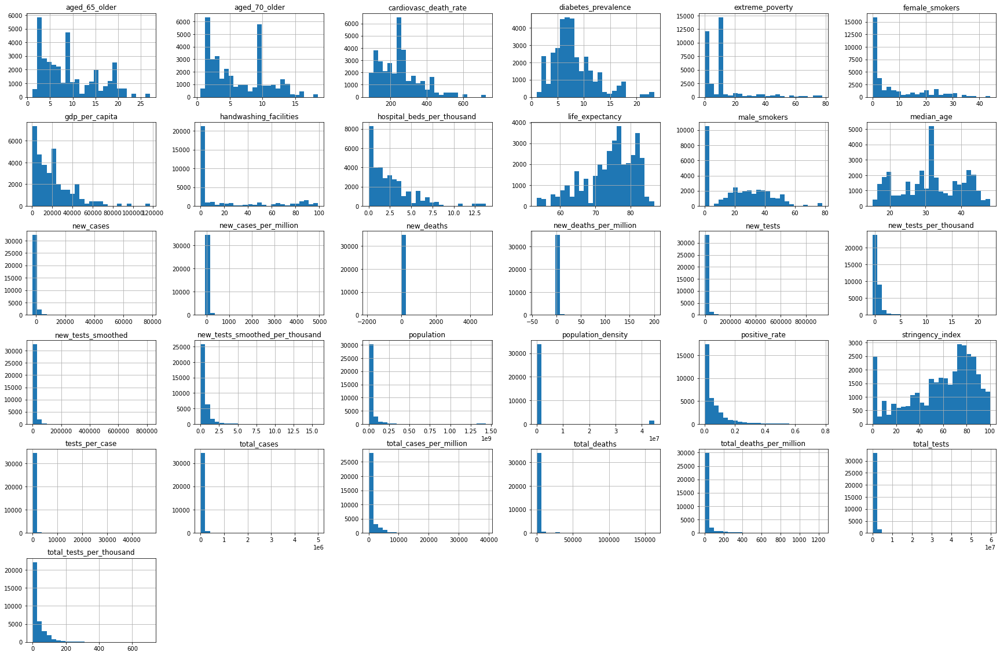

In [9]:
box=df.hist(bins=25,figsize =(30,20))
plt.show()

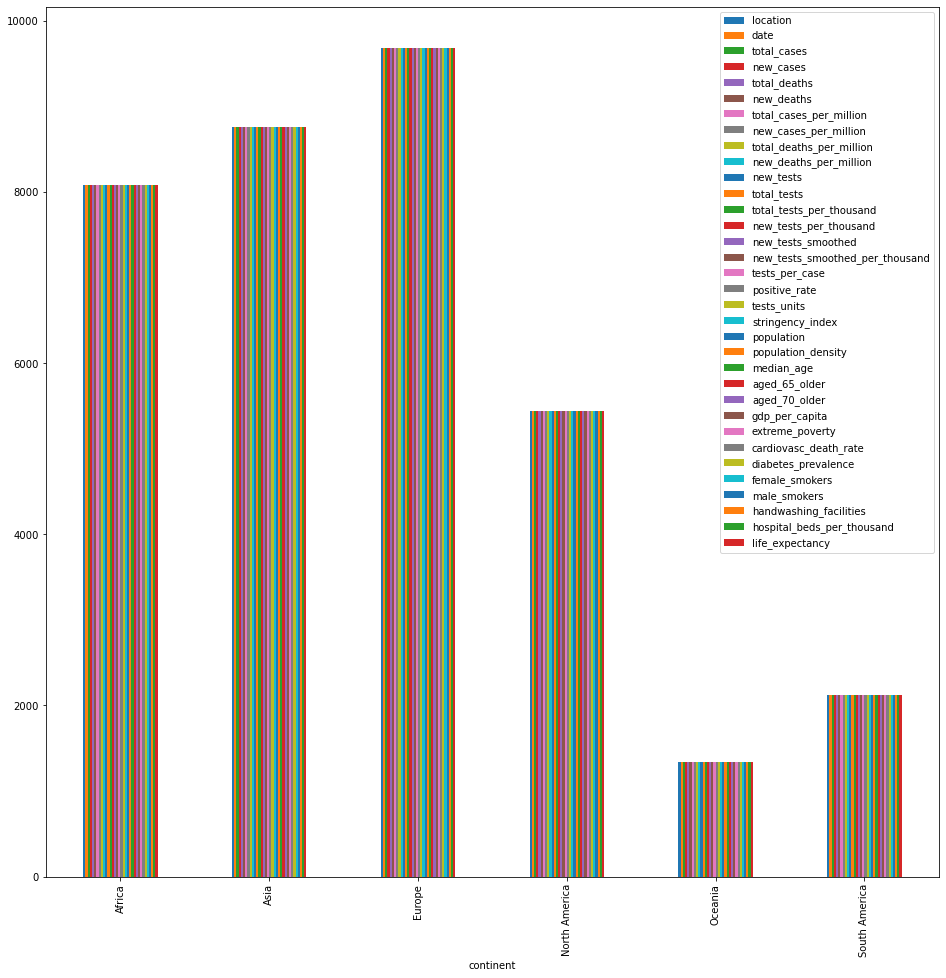

In [10]:
df.groupby('continent').count().plot(kind='bar',figsize =(16,16))

<font color ='teal'> Bivariate data explorations </font>

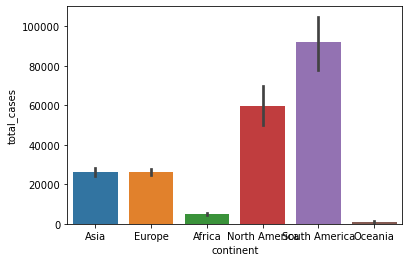

In [11]:
sns.barplot(x='continent', y='total_cases', data=df)
plt.show()

South America have more number of cases and next to it stands North America. Africa as a under developed country and Oceania as a developed country have the least number of cases.Both Asia and Europe have the same amount of cases. 

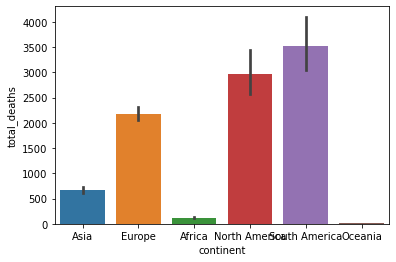

In [12]:
sns.barplot(x='continent', y='total_deaths', data=df)
plt.show()

Same as the total number of cases South America have more number of deaths and next to it stands North America. Both Asia and Europe having the same amount of covid-19 cases the death rate is observed unambiguously higher in Europe than in Asia. Africa and Oceania have the least death rate.

In [13]:
US_Brazil = df[ (df['location']=='United States') | (df['location'] == 'Brazil')]

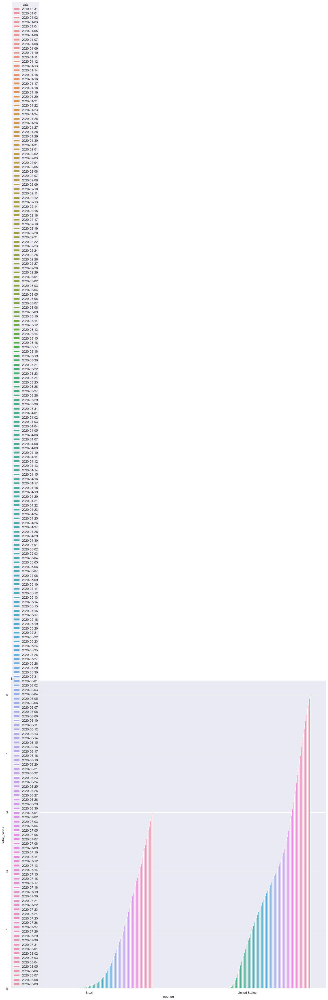

In [14]:
sns.set(rc ={"figure.figsize":(20,20)})
sns.barplot(x='location',y='total_cases',data=US_Brazil,hue ='date')
plt.show()

From the above barplot we can observe that the first confirmed cases of covid-19 in United States was reported on march month of 2020 and the count drastically increased. And first covid-19 confirmed cases in Brazil was reported on april month of 2020. Comparing to United States the count is less, though it also have drastic increase in covid-19 case count.

In [15]:
China_India = df[(df['location']=='China') | (df['location']=='India')]

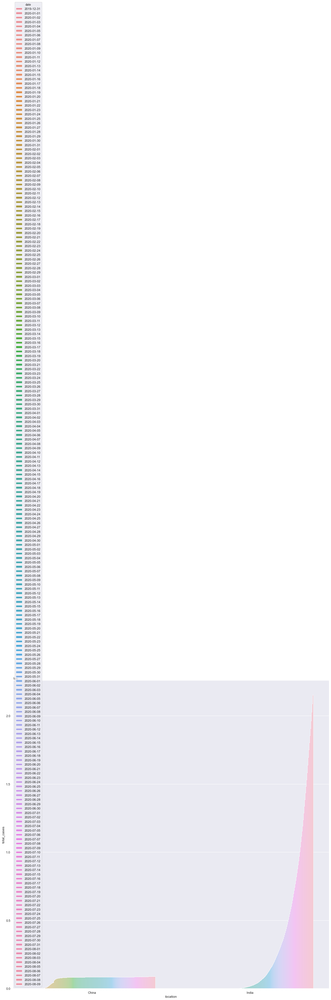

In [16]:
sns.set(rc={'figure.figsize': (20,20)})
sns.barplot(x='location',y='total_cases',data=China_India,hue ='date')
plt.show()

The outbreak was first identified in Wuhan, China, in December 2019. From the above bar plot we can observe the same. Even though it started very early in China we can observe a flattened curve. The first covid-19 case in India was reported in March,2020 and had a drastic increase in total numbers of cases when compared with China.

In [17]:
spain_germany = df[(df['location']=='Spain') | (df['location'] == 'Germany')]

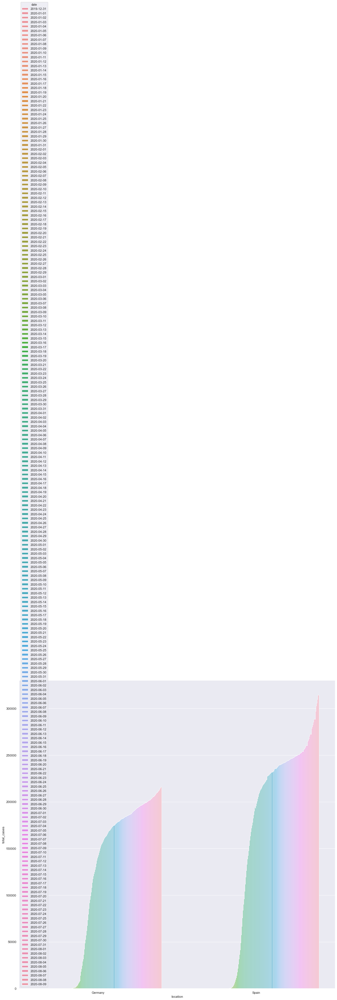

In [18]:
sns.set(rc={'figure.figsize': (20,20)})
sns.barplot(x='location',y='total_cases',data=spain_germany,hue ='date')
plt.show()

From the above barplot we can see that the first covid-19 case was almost reported around the same time both in Germany and Spain. And we can see a drastic increase in countin both countries. Spain has more cases when compared with Germany.

Plot scatter plots of the features with the response variable "total_cases"

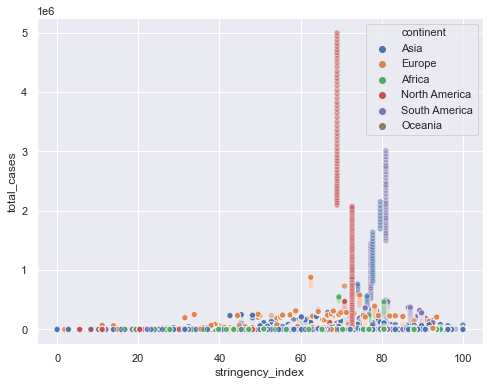

In [19]:
sns.set(rc ={'figure.figsize': (8,6)})
sns.scatterplot(x = 'stringency_index', y = 'total_cases',data = df,alpha = 0.5,color = 'g',hue = 'continent')

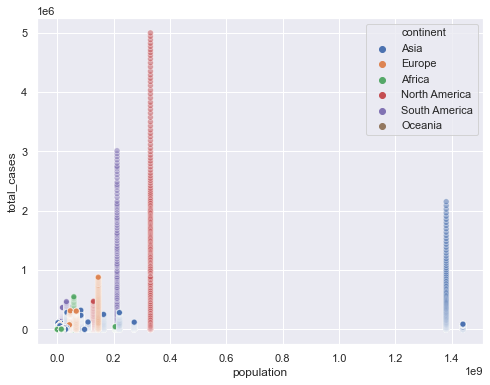

In [20]:
sns.set(rc ={'figure.figsize': (8,6)})
sns.scatterplot(x = 'population', y = 'total_cases',data = df,alpha = 0.5,color = 'g',hue = 'continent')

Although the population is very high in Asia when compared with North America and South America the total number of covid-19 cases is more in North America and South America  despite its population.

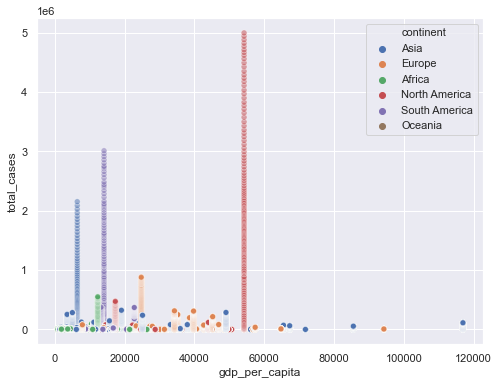

In [21]:
sns.set(rc ={'figure.figsize': (8,6)})
sns.scatterplot(x = 'gdp_per_capita', y = 'total_cases',data = df,alpha = 0.5,color = 'g',hue = 'continent')

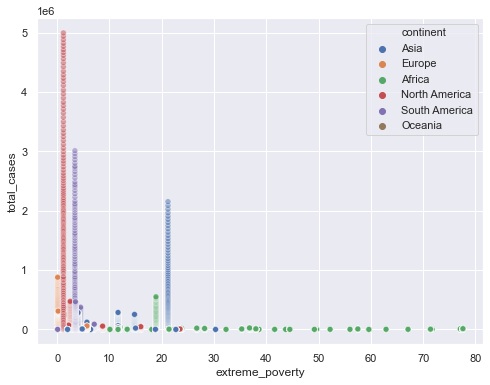

In [22]:
sns.set(rc ={'figure.figsize': (8,6)})
sns.scatterplot(x = 'extreme_poverty', y = 'total_cases',data = df,alpha = 0.5,color = 'g',hue = 'continent')

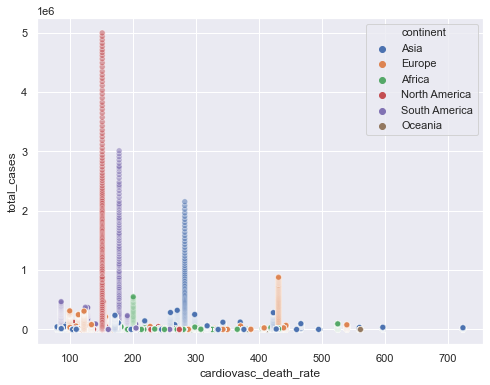

In [23]:
sns.set(rc ={'figure.figsize': (8,6)})
sns.scatterplot(x = 'cardiovasc_death_rate', y = 'total_cases',data = df,alpha = 0.5,color = 'g',hue = 'continent')

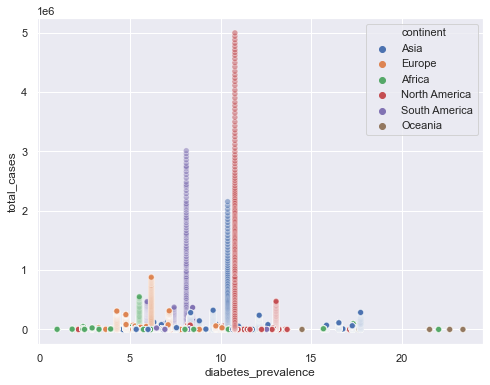

In [24]:
sns.set(rc ={'figure.figsize': (8,6)})
sns.scatterplot(x = 'diabetes_prevalence', y = 'total_cases',data = df,alpha = 0.5,color = 'g',hue = 'continent')

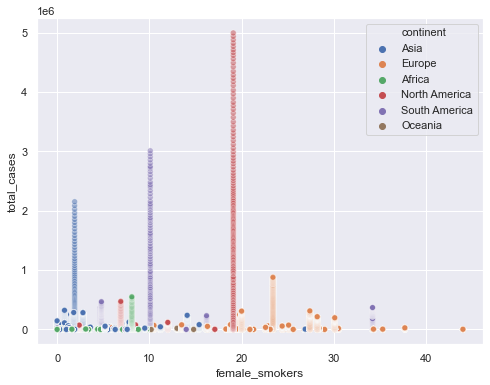

In [25]:
sns.scatterplot(x = 'female_smokers', y ='total_cases' ,data = df,alpha = 0.5,color = 'g',hue = 'continent')

From the above graph we can observe that Europe have more smoking female population comparing to other countries, but still manages the covid-19 count. 

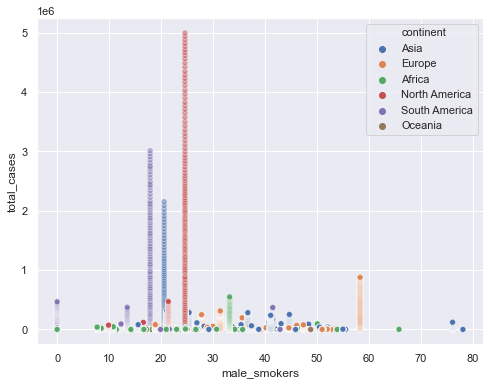

In [26]:
sns.scatterplot(x = 'male_smokers', y ='total_cases' ,data = df,alpha = 0.5,color = 'g',hue = 'continent')

The graph is slighly similar to the previous graph (total_cases vs femole smokers). But cities of Asia, Europe  and Africa also have more smoking male population.

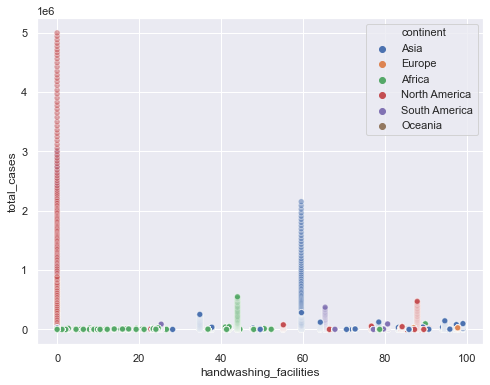

In [27]:
sns.scatterplot(x = 'handwashing_facilities', y ='total_cases' ,data = df,alpha = 0.5,color = 'g',hue = 'continent')

Eventhough the handwashing facilities are very less in Africa the number of cases are very rare in Africa compared to other developed nations.

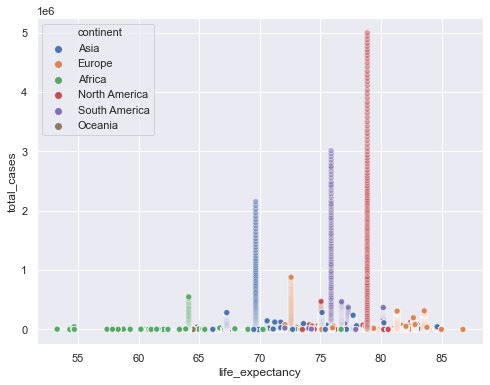

In [28]:
sns.scatterplot(x = 'life_expectancy', y ='total_cases' ,data = df,alpha = 0.5,color = 'g',hue = 'continent')

In [29]:
#Convert the date column into datetime
df['date'] = pd.to_datetime(df['date'])
month = df['date'].dt.month

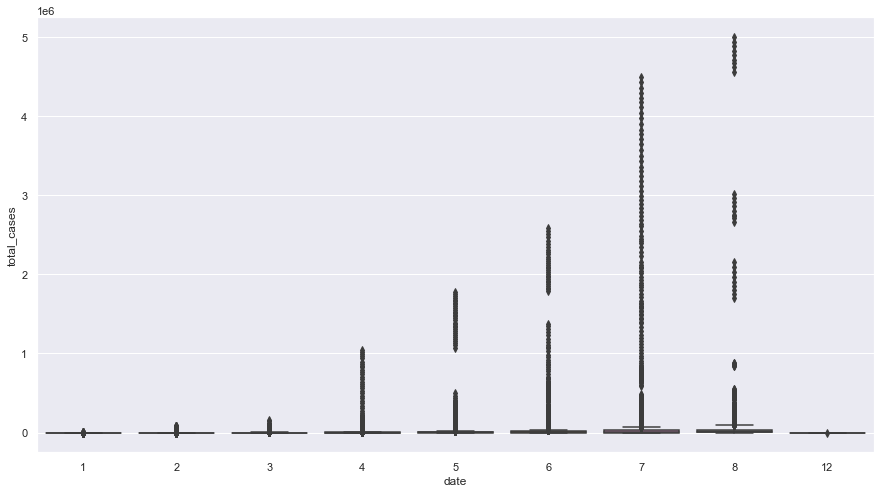

In [30]:

#fig, ax = plt.subplots(nrows=1, ncols=1,figsize=(15, 8))
#sns.boxplot(x=df['date'].dt.month, y='total_cases', data=df, palette="muted")
#plt.show()



fig = px.box(df, x=df['date'].dt.month, y="total_cases") 
fig.iplot()

In [31]:
cf.go_offline() # required to use plotly offline (no account required).
py.init_notebook_mode() # graphs charts inline (IPython).

In [32]:
df.date = pd.to_datetime(df.date)
df.date.sort_values().index
df_by_date = df.loc[df.date.sort_values().index

# Total Covid-19 Cases  (Jan,2019 - Aug,2020)

In [33]:
Cases_by_date = df_by_date.groupby('date')['total_cases'].sum()
Cases_by_date.iplot(kind='bar', title='total cases per day')

View this above plot in your browser at https://plotly.com/~umamohan/10




From this plot we can observe that there is a increasing curve in total covid-19 cases. 

# Total Covid-19 Deaths (Jan,2019 - Aug,2020)

In [34]:
Deaths_by_date = df_by_date.groupby('date')['total_deaths'].sum()
Deaths_by_date.iplot(kind='bar', title='Deaths per day')

View this above plot in your browser at https://plotly.com/~umamohan/12

In [35]:
Cases_deaths = pd.DataFrame({'Total_Cases':Cases_by_date, 'Total_deaths':Deaths_by_date })

color1 = '#9467bd'
color2 = '#F08B00'

trace1 = go.Scatter(
    x = Cases_deaths.index,
    y = Cases_deaths['Total_Cases'],
    name='Total_Cases',
    line = dict(
        color = color1
    )
)
trace2 = go.Scatter(
    x= Cases_deaths.index,
    y =Cases_deaths['Total_deaths'] ,
    name='Total_deaths',
    yaxis='y2',
    mode='markers'

)
data = [trace1, trace2]
layout = go.Layout(
    title= "Total Cases and Deaths per day",
    yaxis=dict(
        title='Total_cases',
        titlefont=dict(
            color=color1
        ),
        tickfont=dict(
            color=color1
        )
    ),
    yaxis2=dict(
        title='Total deaths',
        overlaying='y',
        side='right',
        titlefont=dict(
            color=color2
        ),
        tickfont=dict(
            color=color2
        )

    )

)
fig = go.Figure(data=data, layout=layout)
fig.iplot()




View this above plot in your browser at https://plotly.com/~umamohan/14.
From the plot we can see that the total_deaths curve suddenly increases in middle of March 15,2020.
On March 17,2020 the total number of deaths is approximately 5K. And on April 1,2020 the death count is almost 49K. A drastic increase in covid-19 deaths.
The same happened with total covid-19 case count also a drastic increase, on March 15,2020 total covid-19 case count is 160K and on April 1,2020 the count is approximately 881K(more than thrice times increase in just 15days). 

And by August 9th,2020 the total cases reached almost 19 million and the total deaths reached 698K.

# Covid-19 count in  countries

In [36]:
Cases_by_date = df_by_date.groupby('location')['total_cases'].sum()
Cases_by_date.iplot(kind='bar', title='COVID-19 count in all countries')

View this above plot in your browser at https://plotly.com/~umamohan/20 From the above plot we can observe as of now United States has more count almost 280 million covid-19 cases and Brazil having almost 122 million covid-19 cases is in second position in covid-19 case count 

# 

In [37]:
#Getting the latest date from this dataframe df and storing it in a variable latest_date
latest_date = df['date'].max()
latest_date

Timestamp('2020-08-09 00:00:00')

In [38]:
# the lateset date is August 9th,2020
#Getting latest date cases  and storing it in a variable august_month_cases
last_month_cases = df[df['date'] == latest_date ]
#Sorting the dataframe august_month_cases by total_cases in descending order
august_month_cases = last_month_cases.sort_values(['total_cases'],ascending=[False])
#Storing the first 20 countries which have the maximum number of cases on August 8th,2020
august_month_cases = august_month_cases [1:20]

In [39]:
#priting the august_month_cases first 5 rows
august_month_cases.head()

,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
4829,South America,Brazil,2020-08-09,3012412.0,49970.0,100477.0,905.0,14172.094,235.087,472.701,...,5.060,14103.452,3.4,177.961,8.11,10.1,17.9,0.000,2.20,75.88
15177,Asia,India,2020-08-09,2153010.0,64399.0,43379.0,861.0,1560.147,46.666,31.434,...,3.414,6426.674,21.2,282.280,10.39,1.9,20.6,59.550,0.53,69.66
26927,Europe,Russia,2020-08-09,882347.0,5212.0,14854.0,129.0,6046.187,35.715,101.785,...,9.393,24765.954,0.1,431.297,6.18,23.4,58.3,0.000,8.05,72.58
29610,Africa,South Africa,2020-08-09,553188.0,7712.0,10210.0,301.0,9327.267,130.032,172.150,...,3.053,12294.876,18.9,200.380,5.52,8.1,33.2,43.993,2.32,64.13
21319,North America,Mexico,2020-08-09,475902.0,6495.0,52006.0,695.0,3691.087,50.375,403.358,...,4.321,17336.469,2.5,152.783,13.06,6.9,21.4,87.847,1.38,75.05


In [40]:
fig = px.bar(august_month_cases, x='location', y='total_cases', color='total_cases',title='Countries having maximum covid-19 cases on August 8th,2020',hover_data=['total_cases','hospital_beds_per_thousand','new_cases'])
fig.iplot()

View this above plot in your browser at https://plotly.com/~umamohan/22.

In [41]:
#Sorting the dataframe august_month_cases by total_deaths in descending order
august_month_cases = august_month_cases.sort_values(['total_deaths'],ascending=[False])
#Storing the first 20 countries which have the maximum number of deaths on August 8th,2020
august_month_cases = august_month_cases [1:20]

In [42]:
fig = px.bar(august_month_cases, x='location', y='total_deaths', color='total_deaths',title='Countries having maximum covid-19 deaths on August 8th,2020',hover_data=['total_deaths', 'new_deaths'])
fig.iplot()

View this above plot in your browser at https://plotly.com/~umamohan/24

# Pandas Profiling 

In [45]:
profile = df.profile_report(title='Pandas Profiling Report')
profile.to_file(output_file="covid_pandas_profiling.html")

# Explore Data Relationships

<font color = 'teal'> Create pairplots for the dataframe to explore the data relationships </font>

Pair plot allows us to see both distribution of single variables and relationships between two variables. Pair plots are a great method to identify trends. Create pairplot for the dataframe df using sns.pairplot().

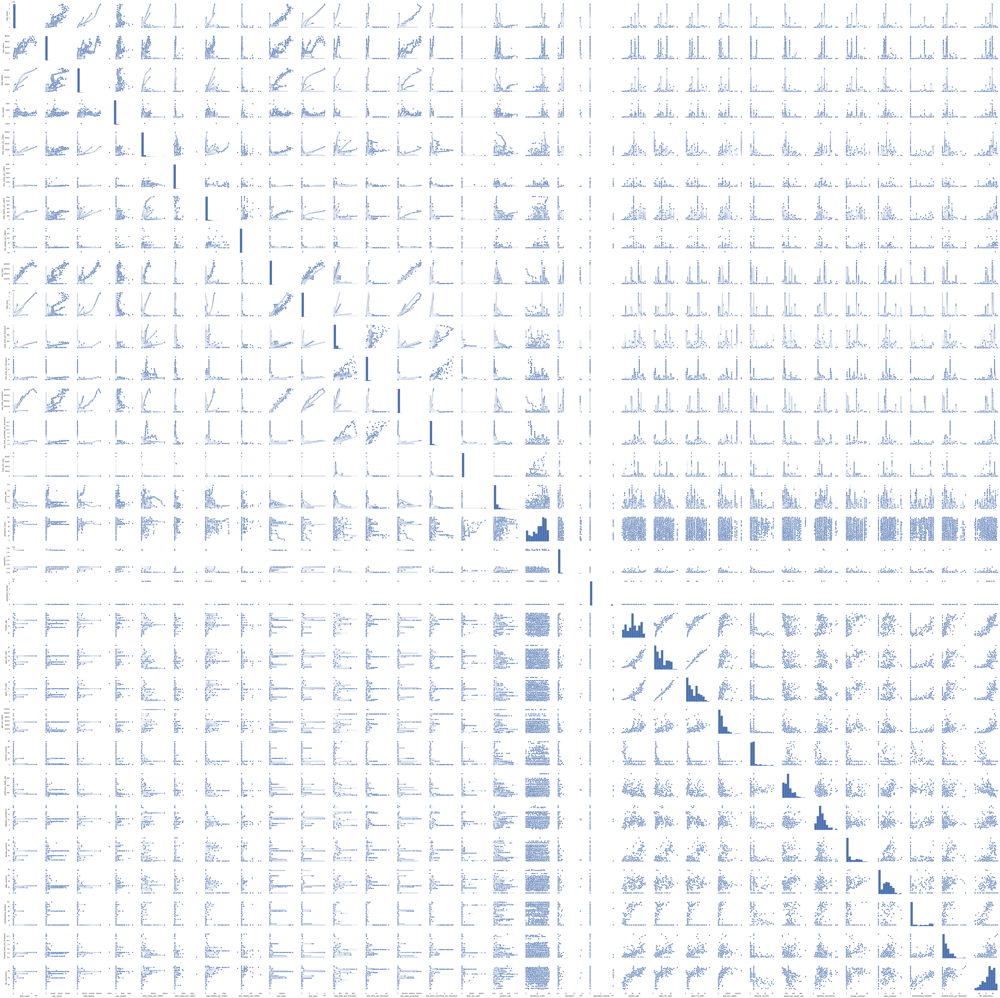

In [46]:
df_PairPlot=sns.pairplot(df)

# Feature Selection

<font color = 'teal'>Create a heatmap to find the correlations between the features of the dataframe df</font>

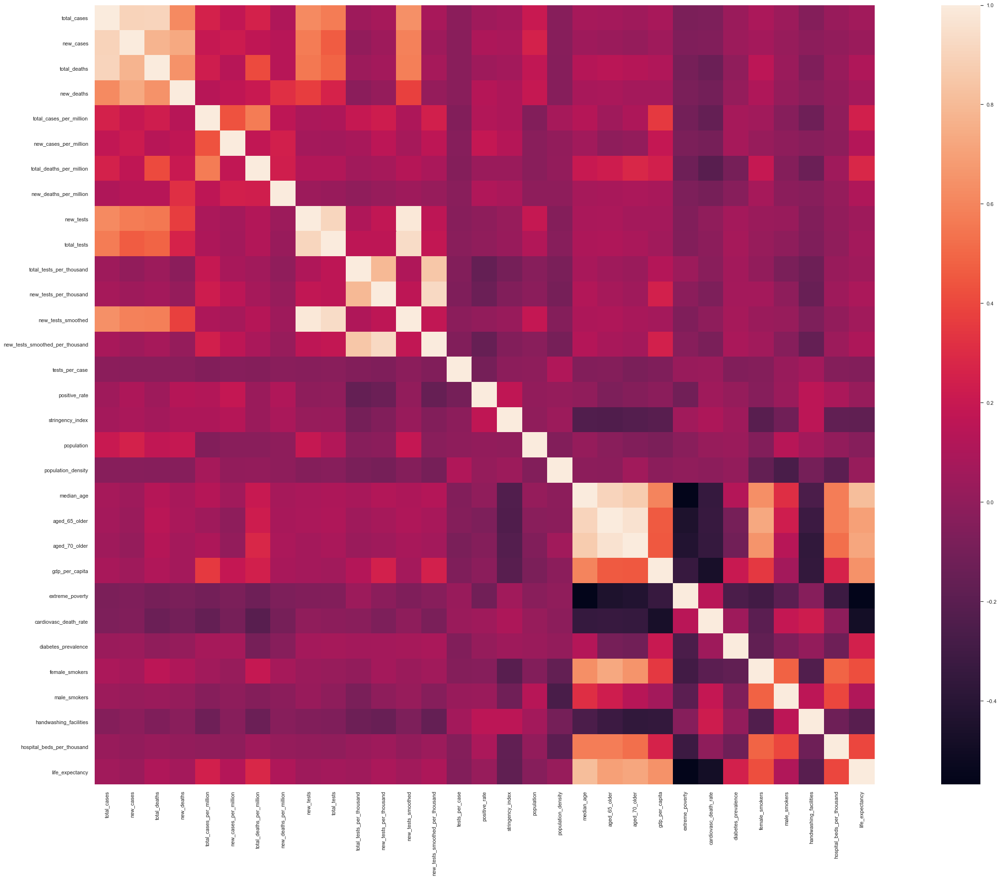

In [47]:
#Lets plot the heatmap to find correlation among the features
sns.set(rc={'figure.figsize': (50,30)})
corr = df.corr()
sns.heatmap(corr,square = True)

In [48]:
#Step 1. Call the variable corr_matrix
corr_matrix = df.drop(['total_cases','new_cases','total_deaths','new_deaths'], axis=1).corr().abs()

#Step 2.the following code is to get the upper triangle of the correlation matrix 
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

#Step 3. This code iterates through our columns and gets the index of any that have a correlation > 0.95
#Call the variable to_drop and store the column that are more than 90% correlated for removal.
to_drop = [column for column in upper.columns if any(upper[column] > 0.90)]

In [49]:
#Priting the column names which are 90% correlated for removal 
print('Features selected to drop is ',to_drop)

Features selected to drop is  ['total_tests', 'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'aged_65_older', 'aged_70_older']


In [50]:
#Now drop the columns from the datafram df which are more than 90% correlated for removal
df = df.drop(df[to_drop],axis=1)

In [51]:
df.shape

(35430, 30)

In [52]:
df.to_csv("step_3_output.csv")